# Síntese de Imagens (Computação Gráfica)

## O que é?
É a criação de imagens ou vídeos a partir de códigos ou expressões matemáticas.

## Aplicação
A aplicação consiste na criação de um vídeo utilizando um codigo escrito em python, nesse código contem apenas instruções matemáticas que são processadas e renderizadas para geração de imagem.

[**Página no Github**](https://github.com/benckx/blender-python-examples/blob/master/planes_rotation_x_axis.py)
Obs: A aplicação original é utilizada diretamente no blender, então realizei uma adaptação com o gemini para fazer as alterações necessárias para rodar direto no notebook.

In [3]:
!pip install matplotlib numpy

In [7]:
# --- Importações Necessárias ---
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.transforms as transforms
from IPython.display import HTML

# --- Configurações Iniciais (semelhante ao script do Blender) ---
max_x = 6
max_y = 6
plane_size = 2  # No matplotlib, usaremos um tamanho de 1 para cada lado do quadrado
padding = 0.5   # Espaçamento entre os quadrados

# --- Preparação da Cena (o "palco" do Matplotlib) ---
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xlim(-1, max_x * (1 + padding))
ax.set_ylim(-1, max_y * (1 + padding))
ax.set_aspect('equal') # Garante que os quadrados não fiquem distorcidos
ax.axis('off') # Remove os eixos para um visual mais limpo

# --- Criação dos Objetos (os "planos") ---
# Em vez de objetos 3D, criaremos uma lista de objetos 2D (Retângulos)
squares = []
for x in range(max_x):
    for y in range(max_y):
        # Calcula a posição do canto inferior esquerdo de cada quadrado
        pos_x = x * (1 + padding)
        pos_y = y * (1 + padding)
        square = plt.Rectangle((pos_x, pos_y), 1, 1, fc='royalblue')
        squares.append(square)
        ax.add_patch(square)

# --- Função de Animação (o que acontece em cada "frame") ---
# Esta função será chamada repetidamente para criar a animação.
# 'i' é o número do frame atual.
def animate(i):
    # Para cada quadrado na nossa lista...
    for idx, square in enumerate(squares):
        # Calcula o centro do quadrado para girar em torno dele
        center_x = square.get_x() + 0.5
        center_y = square.get_y() + 0.5
        
        # Calcula o ângulo de rotação baseado no frame e na posição do quadrado
        # Isso cria um efeito de onda na animação
        angle_deg = (i * 2) + (idx * 5)
        
        # Cria a transformação de rotação e a aplica ao quadrado
        rotation = transforms.Affine2D().rotate_deg_around(center_x, center_y, angle_deg)
        square.set_transform(rotation + ax.transData)
        
    return squares # Retorna a lista de objetos que foram atualizados

# --- Criação e Execução da Animação ---
# Número de frames e intervalo em milissegundos entre eles
total_frames = 180
frame_interval = 50 # 50ms

# Cria o objeto de animação que chama a função 'animate' repetidamente
anim = animation.FuncAnimation(
    fig, 
    animate, 
    frames=total_frames, 
    interval=frame_interval,
    blit=True
)

# --- Exibição no Notebook ---
# Converte a animação para um formato HTML/JavaScript que o notebook pode exibir
plt.close() # Impede que uma imagem estática extra seja mostrada
HTML(anim.to_jshtml())

# Processamento de Imagens

## O que é?
É o processamento, gerando uma nova ou com novas características, ou alteração de uma imagem, gerando dados e informações.

## Aplicação
A aplicação consiste na detecção de cores, em uma foto, utilizando um codigo escrito em python, nesse código contem instruções matemáticas que a imagem e destaca as cores que o usuário informou.

[**Página no Github**](https://github.com/Azevedo1996/OpenCV/blob/main/deteccao_cores.py)
Obs: Adaptações feita para usar hsv e para utilizar imagens no sistema na pasta ./imagens

In [1]:
!pip install opencv-python numpy matplotlib

Carregando imagem: ./imagens/as-frutas-sao-alimentos-importantes-para-nossa-saude-alem-serem-muito-saborosas-5bdaec2def6bb-1703798961.jpg
Digite a COR ALVO em (H, S, V) ex: Vermelho: 0 255 255 ou 170 255 255. Amarelo: 30 255 255. Verde: 60 255 255.


 30 255 255


Digite a MARGEM para H, S, V (ex: 10 50 50 para um bom intervalo de cor)


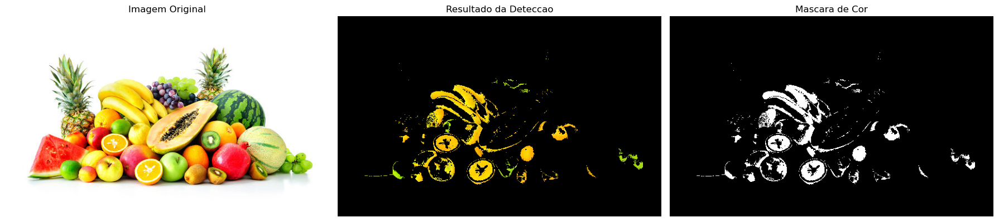

In [6]:
# --- FUNÇÃO PRINCIPAL (adaptada para HSV direto) ---
def perform_color_detection_hsv(frame, target_hsv, h_range, s_range, v_range):
    """
    Realiza a detecção de cor usando uma imagem de referência, com base em intervalos HSV.
    target_hsv: A cor HSV central que você quer detectar (ex: [H, S, V])
    h_range, s_range, v_range: Os thresholds para H, S e V.
    """
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

    # Define os limites inferior e superior para cada componente HSV
    # H (Hue) vai de 0 a 179
    # S (Saturation) vai de 0 a 255
    # V (Value/Brightness) vai de 0 a 255
    
    # Certifica-se que H esteja no intervalo 0-179, S e V em 0-255
    lower_h = np.clip(target_hsv[0] - h_range, 0, 179)
    upper_h = np.clip(target_hsv[0] + h_range, 0, 179)
    lower_s = np.clip(target_hsv[1] - s_range, 0, 255)
    upper_s = np.clip(target_hsv[1] + s_range, 0, 255)
    lower_v = np.clip(target_hsv[2] - v_range, 0, 255)
    upper_v = np.clip(target_hsv[2] + v_range, 0, 255)

    lower_bound = np.array([lower_h, lower_s, lower_v], dtype=np.uint8)
    upper_bound = np.array([upper_h, upper_s, upper_v], dtype=np.uint8)

    # Lógica especial para o Vermelho (que cruza o 0/179)
    if lower_h > upper_h: # Se o intervalo cruza a linha de 0/179 (ex: para vermelho)
        lower_bound1 = np.array([0, lower_s, lower_v], dtype=np.uint8)
        upper_bound1 = np.array([upper_h, upper_s, upper_v], dtype=np.uint8)
        lower_bound2 = np.array([lower_h, lower_s, lower_v], dtype=np.uint8)
        upper_bound2 = np.array([179, upper_s, upper_v], dtype=np.uint8)
        
        mask1 = cv2.inRange(hsv, lower_bound1, upper_bound1)
        mask2 = cv2.inRange(hsv, lower_bound2, upper_bound2)
        mask = cv2.bitwise_or(mask1, mask2)
    else:
        mask = cv2.inRange(hsv, lower_bound, upper_bound)

    res = cv2.bitwise_and(frame, frame, mask=mask)
    return res, mask


def init_hsv_color():
    print("Digite a COR ALVO em (H, S, V) ex: Vermelho: 0 255 255 ou 170 255 255. Amarelo: 30 255 255. Verde: 60 255 255.")
    target_hsv_str = input()
    target_hsv = tuple(map(int, target_hsv_str.split()))

    ranges_str = '10 50 50'
    h_range, s_range, v_range = tuple(map(int, ranges_str.split()))

    return target_hsv, h_range, s_range, v_range

# --- Nova Função Main ---
def main_notebook_hsv():
    image_folder = './imagens'
    ref_image = load_random_image_from_folder(image_folder)
    
    if ref_image is None:
        return
        
    target_hsv, h_range, s_range, v_range = init_hsv_color()
    
    res, mask = perform_color_detection_hsv(ref_image, target_hsv, h_range, s_range, v_range)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(cv2.cvtColor(ref_image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Imagem Original')
    axes[0].axis('off')

    axes[1].imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Resultado da Deteccao')
    axes[1].axis('off')

    axes[2].imshow(mask, cmap='gray')
    axes[2].set_title('Mascara de Cor')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# --- Chamada da nova função principal ---
main_notebook_hsv()

# Visão Computacional

## O que é?
É a processamento de imagens ou vídeos que busca simular a interpretação humana pelo próprio computador.

## Aplicação
A aplicação consiste na detecção de olhos utilizando o codigo escrito em python.

[**Página no Github**](https://github.com/fabiomattes2016/Visao-Computacional/blob/main/Detec%C3%A7%C3%A3o%20de%20Olhos)

()
()
[[ 60  52  50  50]
 [112  47  47  47]]
()
()


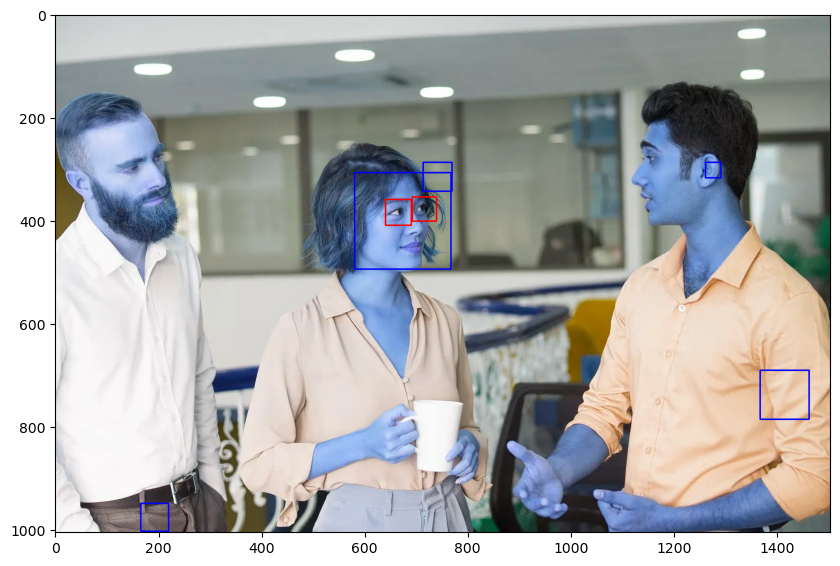

In [8]:
import cv2
import matplotlib.pyplot as plt

classificador_faces = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
classificador_olhos = cv2.CascadeClassifier('haarcascade_eye.xml')

imagem = cv2.imread('./imagens/pessoas.jpg')
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

faces = classificador_faces.detectMultiScale(imagem_cinza)

for [x, y, l, a] in faces:
  imagem = cv2.rectangle(imagem,
                         (x,y),
                         (x + l, y + a),
                         (0,0,255),
                         2)
  regiao = imagem[y:y+a, x:x+l]
  regiao_cinza = cv2.cvtColor(regiao, cv2.COLOR_BGR2GRAY)
  olhos_detectados = classificador_olhos.detectMultiScale(regiao_cinza)

  print(olhos_detectados)

  for [ox, oy, ol, oa] in olhos_detectados:
    cv2.rectangle(regiao,
                  (ox, oy),
                  (ox+ol, oy+oa),
                  (255,0,0),
                  2)
 
fig = plt.figure(figsize=(10,8))

plt.imshow(imagem)

# Visão Computacional

## O que é?
É a processamento de dados transformado em um visão mais compreensível para o ser humano.

## Aplicação
A aplicação consiste na elaboração visual de um fluxo, utilizando grafos, para a resolução de equações.

[**Página no Github**](https://github.com/AKookani/Computational-Graph-Generator/blob/main/Computational_Graph.ipynb)
Obs: Criei uma adaptaÇão para o usuário poder digitar a equação desejada, sem precisar alterar direto no código

In [6]:
!pip install sympy networkx matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 6.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 7.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.2/536.2 kB 2.4 MB/s eta 0:00:00


Digite uma equação


 x + y ** 2


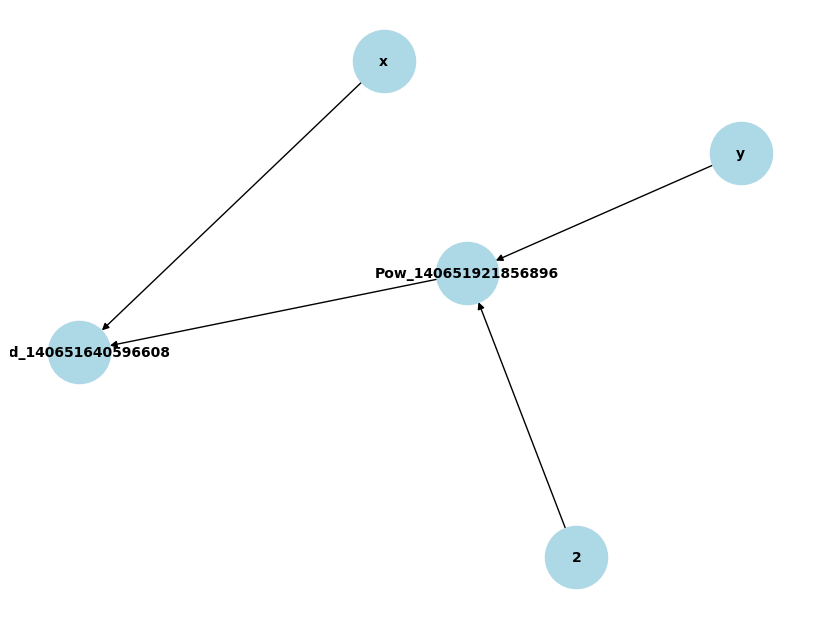

In [7]:
import sympy as sp
import networkx as nx
import matplotlib.pyplot as plt

# Function to generate a computational graph
def build_computational_graph(expr):
    # Convert string expression to SymPy expression
    sympy_expr = sp.sympify(expr)

    # Create a directed graph
    G = nx.DiGraph()

    # Recursive function to add nodes and edges to the graph
    def add_edges(expr, parent=None):
        if isinstance(expr, sp.Symbol):
            # Add symbol as a node if it hasn't been added yet
            G.add_node(str(expr))
            if parent:
                G.add_edge(str(expr), str(parent))
        elif isinstance(expr, sp.Number):
            # Add number as a node
            G.add_node(str(expr))
            if parent:
                G.add_edge(str(expr), str(parent))
        else:
            # Handle operations like Add, Mul, etc.
            operation = type(expr).__name__  # Get the operation type (e.g., 'Add', 'Mul')
            node_label = f"{operation}_{id(expr)}"  # Unique node label for the operation
            G.add_node(node_label)
            if parent:
                G.add_edge(node_label, str(parent))

            # Recursively add edges for each argument of the operation
            for arg in expr.args:
                add_edges(arg, node_label)

    # Start building the graph from the expression root
    add_edges(sympy_expr)
    return G

# Function to visualize the computational graph
def visualize_graph(G):
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G)  # Positions for all nodes
    nx.draw(G, pos, with_labels=True, node_size=2000, node_color='lightblue', font_size=10, font_weight='bold')
    plt.show()

# Example usage
print('Digite uma equação')
expression = input()
G = build_computational_graph(expression)
visualize_graph(G)